<a href="https://colab.research.google.com/github/mcnica89/Markov-Chains-RL-W24/blob/main/Value_Iteration_for_the_Gambler's_Problem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

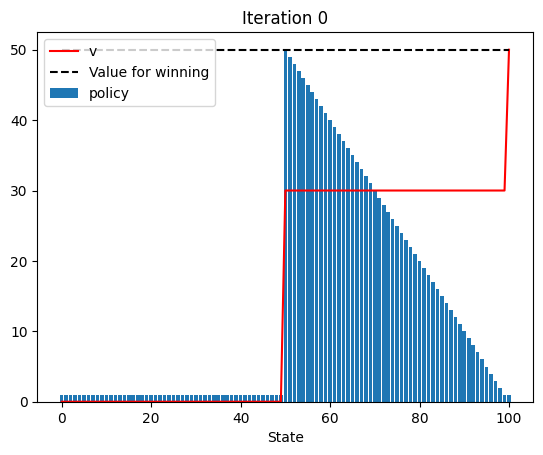

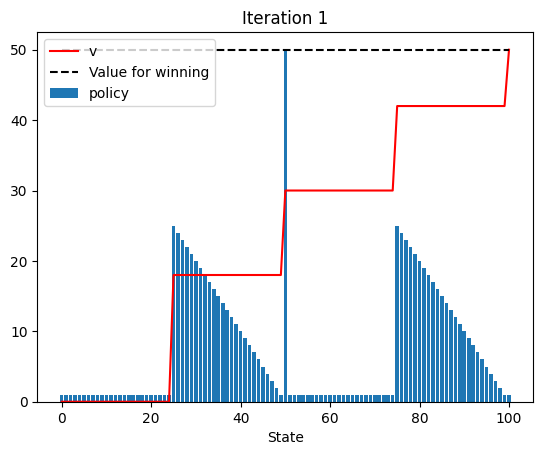

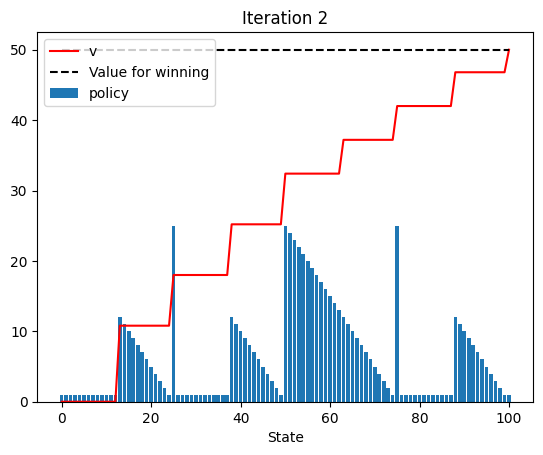

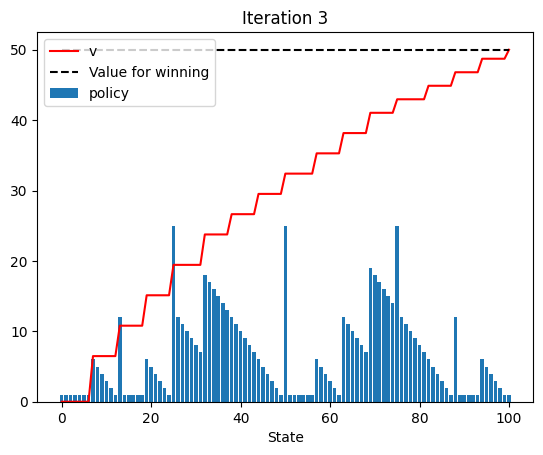

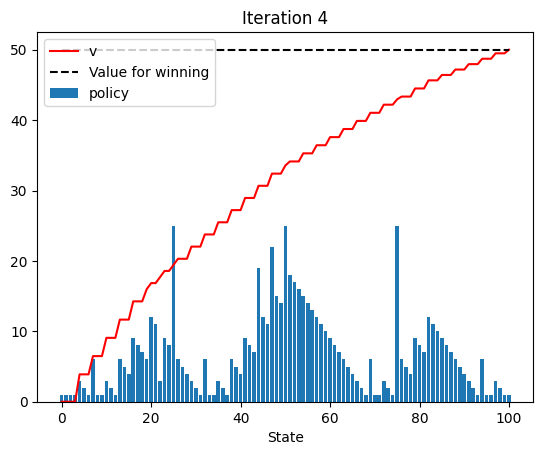

...

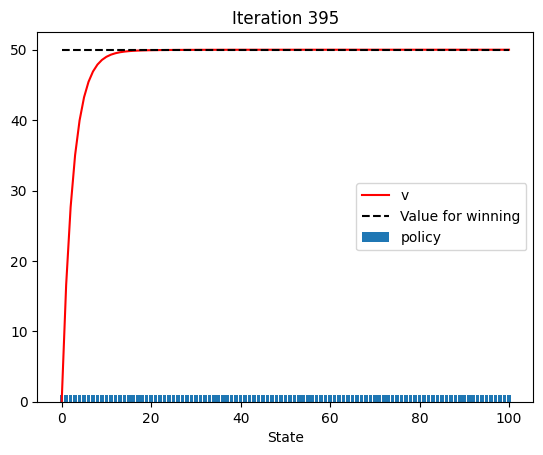

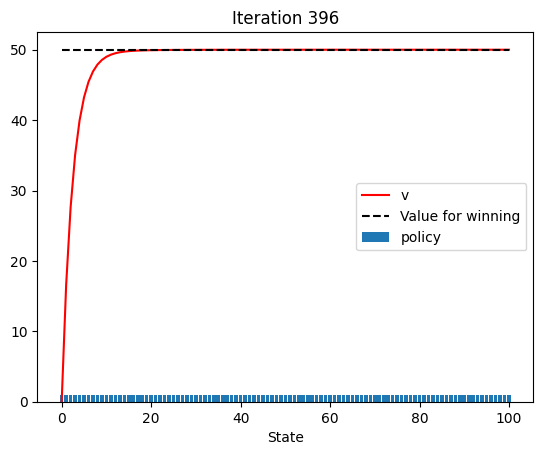

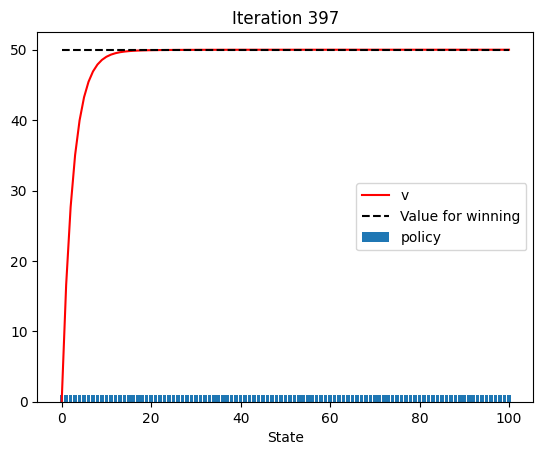

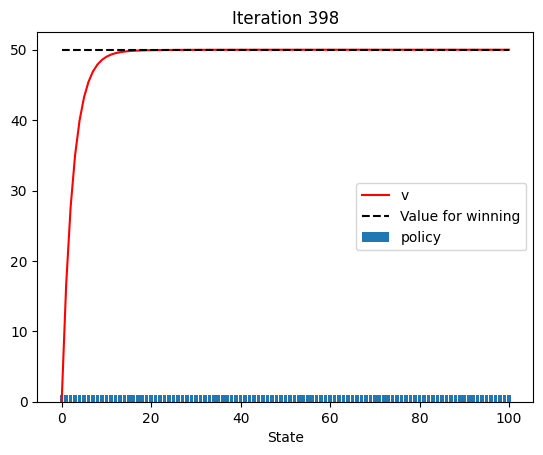

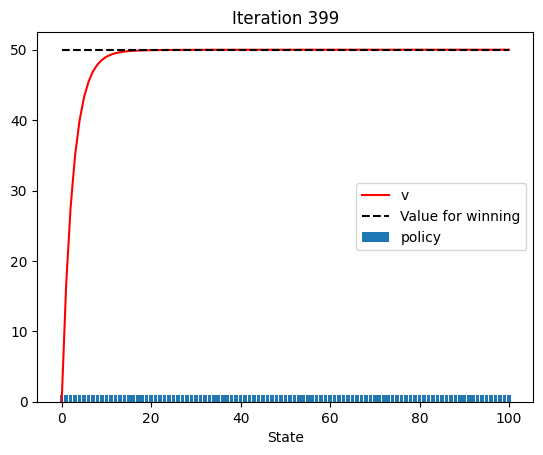

In [ ]:
n  = 100
p_win = 0.6

v = np.zeros((n+1))
v[n] = 1.0 #value of reaching the goal is definetly 1

q = np.zeros((n+1,n+1)) #note q(s,a) is not allowed for s > a or s>n - a
q[:,0] = -1 #you are not allowed to bet 0 so set this even lower

policy = np.ones(n+1) #the best action!
epsilon = 0.000001 #tiny value added to break ties in the best action function.

num_iters = 400
for iter in range(num_iters):
  for s in range(1,n):
    max_bet = min(s,n-s)
    for a in range(1,max_bet+1):
      q[s,a] = p_win*v[s+a] + (1-p_win)*v[s-a]

  for s in range(n):
    v[s] = np.max(q[s,:])
    policy[s] = np.argmax( q[s,:]-epsilon*np.arange(n+1) )

  plt.title(f"Iteration {iter}")
  plt.plot(np.arange(n+1),v*(n/2),color="red",label="v")
  plt.hlines(n/2,0,n,color='k',linestyles='--',label="Value for winning")
  plt.bar(np.arange(n+1),policy,label="policy")
  plt.xlabel("State")
  plt.legend()
  plt.show()

